# Puregym Review Analysis

The majority of the code below has been ran on VSCode locally. It requires certain packages and their dependencies such as Microsoft C++ Build Tools. Several code cells, converted to text, are computationally invensive; run them on hardware with integrated GPU/TPUs or load the provided csv files which are outputs of the code.  

### Importing Packages and Data

In [1]:
import gdown
import pandas as pd
import numpy as np
import nltk
from nltk.corpus import stopwords
from nltk.tokenize import word_tokenize
from nltk.tokenize.punkt import PunktSentenceTokenizer, PunktParameters
from nltk.stem import WordNetLemmatizer
from nltk.probability import FreqDist
import re
import string
from wordcloud import WordCloud
import matplotlib.pyplot as plt
from bertopic import BERTopic
from sentence_transformers import SentenceTransformer
from transformers import pipeline, AutoTokenizer, AutoModelForSequenceClassification, AutoModelForCausalLM
import torch
from sklearn.model_selection import train_test_split
from gensim.corpora import Dictionary
from gensim.models import LdaModel
import pyLDAvis.gensim_models as gensimvis
import pyLDAvis

In [3]:
# Function to download file from Google Drive
def download_from_gdrive(gdrive_link, output_file):
    gdown.download(gdrive_link, output_file, quiet=False)

In [4]:
# File paths and file names
gdrive_link_google = 'https://drive.google.com/uc?id=13TeZTT6oqk3iPELBhFx9hComIfChKw4m'
gdrive_link_trustpilot = 'https://drive.google.com/uc?id=1V6Pr6xWrHSHaothB61MJbR7mPFHwQ1u6'
output_file_google = 'Google_12_months.xlsx'
output_file_trustpilot = 'Trustpilot_12_months.xlsx'

In [13]:
#####


# Remove hashes in front of code below to run. Removed from run as download slows code, and only needs to be done once. 

# Download the files
# download_from_gdrive(gdrive_link_google, output_file_google)
# download_from_gdrive(gdrive_link_trustpilot, output_file_trustpilot)

# Download all nltk resources. I attempted to download the required resources separately but got a Lookup Error, this solves it
#nltk.download('all')
nltk.download('punkt')
stop_words = set(stopwords.words('english'))


#####

[nltk_data] Downloading package punkt to
[nltk_data]     C:\Users\alger\AppData\Roaming\nltk_data...
[nltk_data]   Package punkt is already up-to-date!


In [2]:
# Transform into dataframes
df_google = pd.read_excel('Google_12_months.xlsx')
df_trustpilot = pd.read_excel('Trustpilot_12_months.xlsx')

# Function to list column names of a dataframe
def list_column_names(df, name):
    if df is not None:
        print(f"Column names in {name}:")
        for col in df.columns:
            print(col)
    else:
        print(f"Dataframe {name} is not available.")

# List column names for both dataframes
list_column_names(df_google, "Google DataFrame")
print()
list_column_names(df_trustpilot, "Trustpilot DataFrame")

Column names in Google DataFrame:
Customer Name
SurveyID for external use (e.g. tech support)
Club's Name
Social Media Source
Creation Date
Comment
Overall Score

Column names in Trustpilot DataFrame:
Review ID
Review Created (UTC)
Review Consumer User ID
Review Title
Review Content
Review Stars
Source Of Review
Review Language
Domain URL
Webshop Name
Business Unit ID
Tags
Company Reply Date (UTC)
Location Name
Location ID


### Preprocessing Data

In [3]:
# Columns to drop
google_columns_to_drop = ['Customer Name', 'SurveyID for external use (e.g. tech support)', 'Social Media Source']
trustpilot_columns_to_drop = ['Review ID', 'Review Consumer User ID', 'Source Of Review','Review Language','Domain URL','Webshop Name','Business Unit ID','Tags','Location ID','Company Reply Date (UTC)','Review Title']

# Drop columns
df_google.drop(columns=google_columns_to_drop, inplace=True)
df_trustpilot.drop(columns=trustpilot_columns_to_drop, inplace=True)

# List column names for both dataframes
list_column_names(df_google, "Google DataFrame")
print()
list_column_names(df_trustpilot, "Trustpilot DataFrame")

Column names in Google DataFrame:
Club's Name
Creation Date
Comment
Overall Score

Column names in Trustpilot DataFrame:
Review Created (UTC)
Review Content
Review Stars
Location Name


In [4]:
# Renaming columns of df_google
df_google = df_google.rename(columns={
    "Club's Name": 'location',
    'Creation Date': 'date',
    'Comment': 'text',
    'Overall Score': 'score'
})

# Renaming columns of df_trustpilot
df_trustpilot = df_trustpilot.rename(columns={
    'Review Created (UTC)': 'date',
    'Review Content': 'text',
    'Review Stars': 'score',
    'Location Name': 'location'
})

# Reordering columns of df_trustpilot to match the order of df_google
df_trustpilot = df_trustpilot[['location', 'date', 'text', 'score']]

df_google

,location,date,text,score
0,Leeds City Centre North,2024-05-09 23:49:18,NaN,4
1,Cambridge Leisure Park,2024-05-09 22:48:39,Too many students from two local colleges go h...,1
2,London Holborn,2024-05-09 22:08:14,"Best range of equipment, cheaper than regular ...",5
3,Cheshunt Brookfield Shopping Park,2024-05-09 21:58:07,"Good gym when it’s not busy, tend to get too b...",4
4,Bristol Union Gate,2024-05-09 21:48:00,"(current member)\n\nGym is quite dirty, more o...",1
...,...,...,...,...
23245,Sheffield Millhouses,2022-03-07 20:36:22,Chiara's class is great fun and she is a fab i...,5
23246,Sheffield Millhouses,2022-03-07 20:36:22,Perfect gym,5
23247,Sheffield Millhouses,2022-03-07 20:36:21,Loved the pump class today,4
23248,Sheffield Millhouses,2022-03-07 20:36:21,Excellent gym with very friendly staff. All th...,5


In [5]:
df_trustpilot

,location,date,text,score
0,Solihull Sears Retail Park,2024-05-09 23:29:00,A very good environment,5
1,Aylesbury,2024-05-09 23:11:00,I love to be part of this gym. Superb value fo...,5
2,Sutton Times Square,2024-05-09 22:51:00,"Extremely busy, no fresh air.",1
3,London Finchley,2024-05-09 22:35:00,"Great vibes, fantastic gym",5
4,Crayford,2024-05-09 22:30:00,"Clean, well managed, classes are good.",5
...,...,...,...,...
16668,Rushden,2023-05-16 23:30:00,I enjoy the classes and the weights etc are ea...,4
16669,Yate,2023-05-16 23:18:00,"Happy and helpful staff, feel very comfortable...",5
16670,NaN,2023-05-16 23:16:00,Showers never maintain the same temp. Not clea...,4
16671,NaN,2023-05-16 23:15:00,Getting back to gym after be off for 3 months ...,5


In [6]:
# Function to count NaN values per column
def count_nan_values(df, name):
    if df is not None:
        nan_counts = df.isna().sum()
        print(f"NaN values per column in {name}:")
        print(nan_counts)
    else:
        print(f"Dataframe {name} is not available.")

# Count NaN values for both dataframes
count_nan_values(df_google, "Google DataFrame")
print()
count_nan_values(df_trustpilot, "Trustpilot DataFrame")

NaN values per column in Google DataFrame:
location       0
date           0
text        9352
score          0
dtype: int64

NaN values per column in Trustpilot DataFrame:
location    5350
date           0
text           0
score          0
dtype: int64


In [7]:
# Drop rows where there is no review
df_google = df_google.dropna(subset=['text'])

# Count NaN values for both dataframes
count_nan_values(df_google, "Google DataFrame")
print()
count_nan_values(df_trustpilot, "Trustpilot DataFrame")

NaN values per column in Google DataFrame:
location    0
date        0
text        0
score       0
dtype: int64

NaN values per column in Trustpilot DataFrame:
location    5350
date           0
text           0
score          0
dtype: int64


### Preprocessing Text

In [8]:
# Function to preprocess text
def preprocess_text(text):
    # Convert to lowercase
    text = text.lower()
    # Replace hyphens with spaces to separate hyphenated words
    text = text.replace('-', ' ')
    # Remove numbers
    text = re.sub(r'\d+', '', text)
    # Remove punctuation and specific unwanted characters
    text = text.translate(str.maketrans('', '', string.punctuation + '’'))
    # Remove stop words and single-letter words
    text = ' '.join([word for word in text.split() if word not in stop_words and len(word) > 1])
    return text

In [9]:
# Explicitly set the Punkt tokenizer
punkt_param = PunktParameters()
tokenizer = PunktSentenceTokenizer(punkt_param)

# Function to tokenize text
def tokenize_text(text):
    return word_tokenize(text)

In [10]:
# Initialize lemmatizer
lemmatizer = WordNetLemmatizer()

# Define the function to lemmatize tokens
def lemmatize_tokens(tokens):
    return [lemmatizer.lemmatize(token) for token in tokens]

In [14]:
# Apply pre-preprocessing
df_google['tokenized_text'] = df_google['text'].apply(preprocess_text)
df_trustpilot['tokenized_text'] = df_trustpilot['text'].apply(preprocess_text)

In [15]:
# Apply tokenization
df_google['tokenized_text'] = df_google['tokenized_text'].apply(tokenize_text)
df_trustpilot['tokenized_text'] = df_trustpilot['tokenized_text'].apply(tokenize_text)

# Apply lemmatization
df_google['lemmatized_text'] = df_google['tokenized_text'].apply(lemmatize_tokens)
df_trustpilot['lemmatized_text'] = df_trustpilot['tokenized_text'].apply(lemmatize_tokens)

# Creating the lemmatized_string column by joining the tokens into a single string
df_google['lemmatized_string'] = df_google['lemmatized_text'].apply(lambda tokens: ' '.join(tokens))
df_trustpilot['lemmatized_string'] = df_trustpilot['lemmatized_text'].apply(lambda tokens: ' '.join(tokens))

# Save output to csv. note that this removes tokenization, therefore this code cell needs to be re-ran
df_google.to_csv('google_clean.csv', index=False)
df_trustpilot.to_csv('trustpilot_clean.csv', index=False)

In [14]:
df_google

,location,date,text,score,tokenized_text,lemmatized_text,lemmatized_string
1,Cambridge Leisure Park,2024-05-09 22:48:39,Too many students from two local colleges go h...,1,"[many, students, two, local, colleges, go, lea...","[many, student, two, local, college, go, leave...",many student two local college go leave rubbis...
2,London Holborn,2024-05-09 22:08:14,"Best range of equipment, cheaper than regular ...",5,"[best, range, equipment, cheaper, regular, gym...","[best, range, equipment, cheaper, regular, gym...",best range equipment cheaper regular gym profe...
3,Cheshunt Brookfield Shopping Park,2024-05-09 21:58:07,"Good gym when it’s not busy, tend to get too b...",4,"[good, gym, busy, tend, get, busy, late, after...","[good, gym, busy, tend, get, busy, late, after...",good gym busy tend get busy late afternoon har...
4,Bristol Union Gate,2024-05-09 21:48:00,"(current member)\n\nGym is quite dirty, more o...",1,"[current, member, gym, quite, dirty, often, th...","[current, member, gym, quite, dirty, often, th...",current member gym quite dirty often there soa...
5,"209 - Slagelse, Jernbanegade",2024-05-09 21:36:17,Kom og betalte for en prøvetime i centret. Fik...,1,"[kom, og, betalte, en, prøvetime, centret, fik...","[kom, og, betalte, en, prøvetime, centret, fik...",kom og betalte en prøvetime centret fik blot e...
...,...,...,...,...,...,...,...
23244,London Muswell Hill,2022-03-07 20:46:38,Great gym and instructors. Please make sure th...,5,"[great, gym, instructors, please, make, sure, ...","[great, gym, instructor, please, make, sure, j...",great gym instructor please make sure james ma...
23245,Sheffield Millhouses,2022-03-07 20:36:22,Chiara's class is great fun and she is a fab i...,5,"[chiaras, class, great, fun, fab, instructor, ...","[chiaras, class, great, fun, fab, instructor, ...",chiaras class great fun fab instructor peach
23246,Sheffield Millhouses,2022-03-07 20:36:22,Perfect gym,5,"[perfect, gym]","[perfect, gym]",perfect gym
23247,Sheffield Millhouses,2022-03-07 20:36:21,Loved the pump class today,4,"[loved, pump, class, today]","[loved, pump, class, today]",loved pump class today


### Frequency Analysis

Of the entire dataset

In [17]:
# Function to calculate word frequencies
def calculate_word_frequencies(tokenized_comments):
    # Flatten the list of tokenized comments
    all_words = [word for tokens in tokenized_comments for word in tokens]
    # Calculate frequency distribution
    freq_dist = FreqDist(all_words)
    return freq_dist

10 highest frequency words in Google:
gym: 10566
equipment: 3752
class: 3676
great: 3554
good: 3454
staff: 2771
machine: 2314
time: 2076
clean: 1843
friendly: 1738

10 highest frequency words in Trustpilot:
gym: 11563
equipment: 4570
good: 4081
great: 3792
staff: 3597
class: 3342
clean: 2498
friendly: 2494
machine: 2405
time: 2255


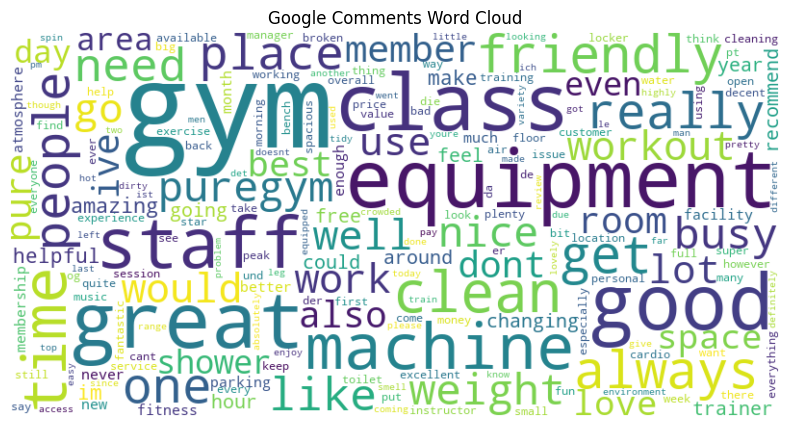

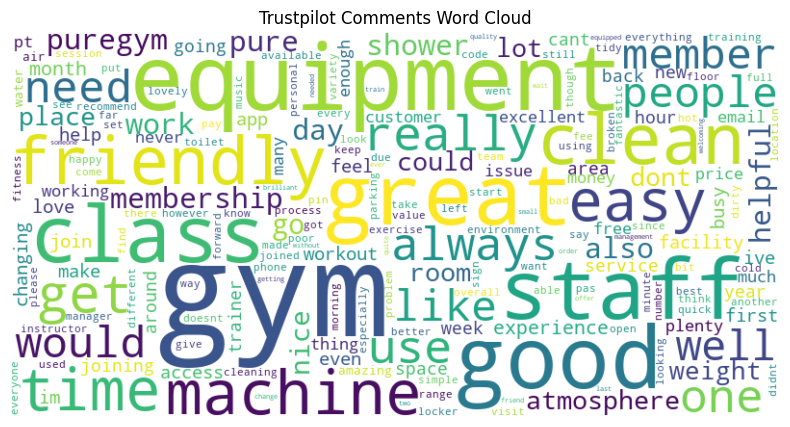

In [18]:
# Calculate frequency of each word and display top 10 words
google_freq_dist = calculate_word_frequencies(df_google['lemmatized_text'])
print("10 highest frequency words in Google:")
for word, freq in google_freq_dist.most_common(10):  
    print(f"{word}: {freq}")

print()

trustpilot_freq_dist = calculate_word_frequencies(df_trustpilot['lemmatized_text'])
print("10 highest frequency words in Trustpilot:")
for word, freq in trustpilot_freq_dist.most_common(10):
    print(f"{word}: {freq}")

# Function to generate and display word cloud
def generate_wordcloud(freq_dist, title):
    wordcloud = WordCloud(width=800, height=400, background_color='white').generate_from_frequencies(freq_dist)
    plt.figure(figsize=(10, 5))
    plt.imshow(wordcloud, interpolation='bilinear')
    plt.title(title)
    plt.axis('off')
    plt.show()

# Generate word clouds
generate_wordcloud(google_freq_dist, 'Google Comments Word Cloud')
generate_wordcloud(trustpilot_freq_dist, 'Trustpilot Comments Word Cloud')

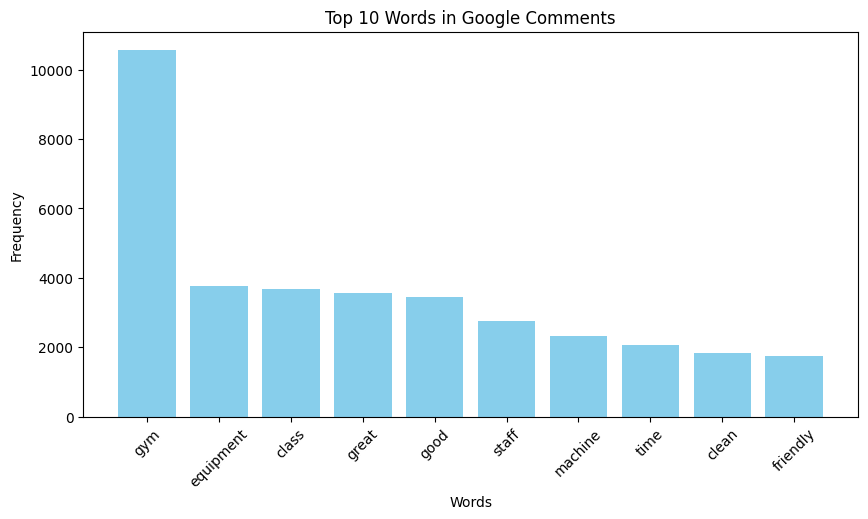

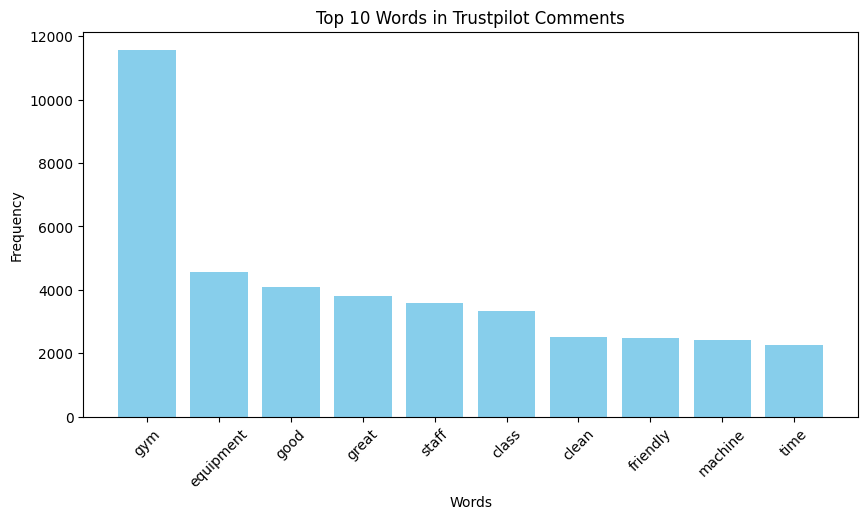

In [19]:
# Function to plot histogram of top 10 words
def plot_top_words_histogram(freq_dist, title):
    top_words = freq_dist.most_common(10)
    words, frequencies = zip(*top_words)
    plt.figure(figsize=(10, 5))
    plt.bar(words, frequencies, color='skyblue')
    plt.xlabel('Words')
    plt.ylabel('Frequency')
    plt.title(title)
    plt.xticks(rotation=45)
    plt.show()

# Plot histograms for the top 10 words in each dataframe
plot_top_words_histogram(google_freq_dist, 'Top 10 Words in Google Comments')
plot_top_words_histogram(trustpilot_freq_dist, 'Top 10 Words in Trustpilot Comments')

Frequency analysis of negative reviews only

In [20]:
# Creating new dataframes containing negative reviews
df_google_negative = df_google[df_google['score'] < 3]
df_trustpilot_negative = df_trustpilot[df_trustpilot['score'] < 3]

# Count the number of rows in each negative dataframe
num_rows_google_negative = df_google_negative.shape[0]
num_rows_trustpilot_negative = df_trustpilot_negative.shape[0]

# Display the number of rows
print(f"Number of rows in df_google_negative: {num_rows_google_negative}")
print(f"Number of rows in df_trustpilot_negative: {num_rows_trustpilot_negative}")

Number of rows in df_google_negative: 2785
Number of rows in df_trustpilot_negative: 3543


In [21]:
# Add a source column to each dataframe
df_google_negative['source'] = 'google'
df_trustpilot_negative['source'] = 'trustpilot'

# Combine the two dataframes
df_negative = pd.concat([df_google_negative, df_trustpilot_negative], ignore_index=True)

# Dropping source column from original dataframes
df_google_negative = df_google_negative.drop(columns=['source'])
df_trustpilot_negative = df_trustpilot_negative.drop(columns=['source'])

df_negative

,location,date,text,score,tokenized_text,lemmatized_text,lemmatized_string,source
0,Cambridge Leisure Park,2024-05-09 22:48:39,Too many students from two local colleges go h...,1,"[many, students, two, local, colleges, go, lea...","[many, student, two, local, college, go, leave...",many student two local college go leave rubbis...,google
1,Bristol Union Gate,2024-05-09 21:48:00,"(current member)\n\nGym is quite dirty, more o...",1,"[current, member, gym, quite, dirty, often, th...","[current, member, gym, quite, dirty, often, th...",current member gym quite dirty often there soa...,google
2,"209 - Slagelse, Jernbanegade",2024-05-09 21:36:17,Kom og betalte for en prøvetime i centret. Fik...,1,"[kom, og, betalte, en, prøvetime, centret, fik...","[kom, og, betalte, en, prøvetime, centret, fik...",kom og betalte en prøvetime centret fik blot e...,google
3,New Barnet,2024-05-09 20:16:04,This gym is way too hot to even workout in. Th...,2,"[gym, way, hot, even, workout, windows, open, ...","[gym, way, hot, even, workout, window, open, a...",gym way hot even workout window open ac barely...,google
4,Manchester Cheetham Hill,2024-05-09 17:03:50,No access for wc 😢. Empty and no assistance t...,2,"[access, wc, empty, assistance, gain, access, ...","[access, wc, empty, assistance, gain, access, ...",access wc empty assistance gain access fault f...,google
...,...,...,...,...,...,...,...,...
6323,Colchester Retail Park,2023-05-17 19:13:00,"Not enough weight plates for benches, spent ha...",2,"[enough, weight, plates, benches, spent, half,...","[enough, weight, plate, bench, spent, half, wo...",enough weight plate bench spent half workout t...,trustpilot
6324,Doncaster,2023-05-17 18:34:00,"I haven't been to PureGym yet, I'm writing thi...",1,"[havent, puregym, yet, im, writing, review, ba...","[havent, puregym, yet, im, writing, review, ba...",havent puregym yet im writing review based mot...,trustpilot
6325,Cardiff Gate,2023-05-17 17:50:00,I've been a member of this gym for about 2 ye...,2,"[ive, member, gym, years, ive, noticed, hygien...","[ive, member, gym, year, ive, noticed, hygiene...",ive member gym year ive noticed hygiene cleanl...,trustpilot
6326,Sheffield Millhouses,2023-05-17 16:40:00,Millhouses. Sheffield. Showers not warm enough...,2,"[millhouses, sheffield, showers, warm, enough,...","[millhouses, sheffield, shower, warm, enough, ...",millhouses sheffield shower warm enough cost s...,trustpilot


10 highest frequency words in Google (Negative):
gym: 6982
equipment: 1691
time: 1566
machine: 1542
staff: 1331
one: 1314
get: 1276
people: 1146
member: 1140
membership: 1106



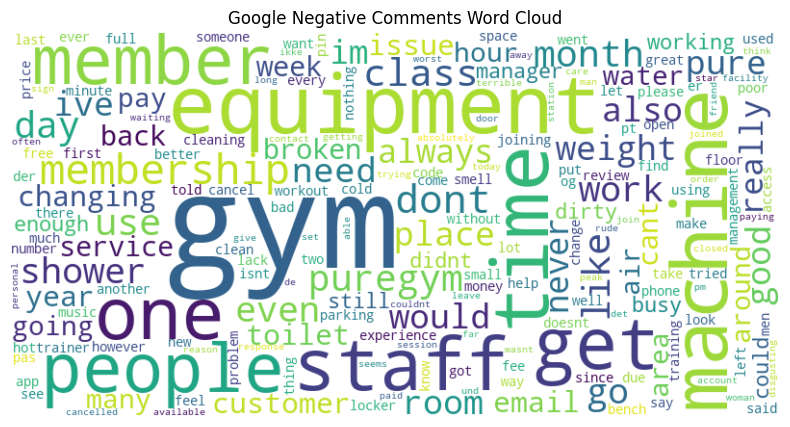

In [22]:
# Calculate frequency of each word and display top 10 words for df_google_negative
freq_dist_negative = calculate_word_frequencies(df_negative['lemmatized_text'])
print("10 highest frequency words in Google (Negative):")
for word, freq in freq_dist_negative.most_common(10):  
    print(f"{word}: {freq}")

print()

# Generate word clouds for negative comments
generate_wordcloud(freq_dist_negative, 'Google Negative Comments Word Cloud')

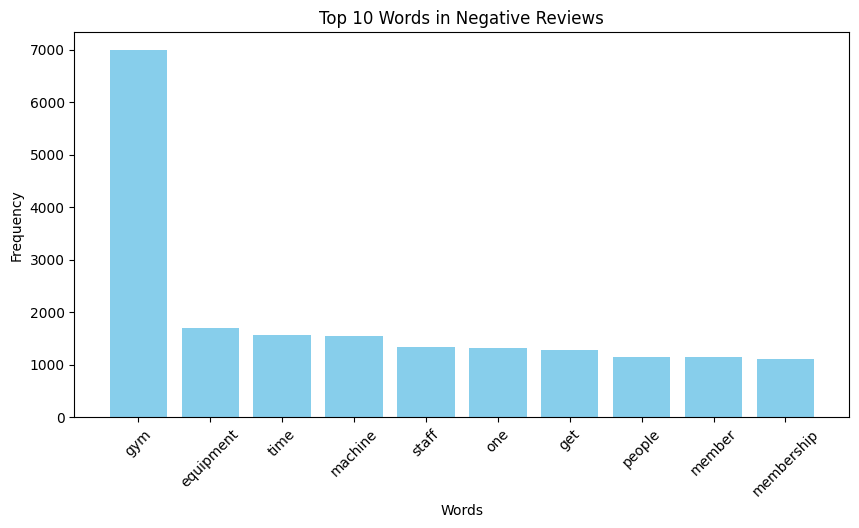

In [23]:
# Plot histograms for the top 10 words in each dataframe
plot_top_words_histogram(freq_dist_negative, 'Top 10 Words in Negative Reviews')

### Location Analysis

First, common locations are identified

In [17]:
# Display unique locations of each dataframe
unique_club_names = df_google["location"].unique()
print("Unique locations in the Google DataFrame:")
print(len(unique_club_names))
print()
unique_location_names = df_trustpilot['location'].unique()
print("Unique locations in the Trustpilot DataFrame:")
print(len(unique_location_names))

Unique locations in the Google DataFrame:
512

Unique locations in the Trustpilot DataFrame:
377


In [18]:
# Create a list of common names between unique_club_names and unique_location_names
common_names = list(set(unique_club_names).intersection(set(unique_location_names)))
print("Common names between Google and Trustpilot:")
print(len(common_names))

Common names between Google and Trustpilot:
310


Then, the df_negative dataframe is filtered for common locations

In [19]:
# Filter the dataframe to keep only rows where 'location' is in 'common_names'
df_negative = df_negative[df_negative['location'].isin(common_names)]

df_negative

,location,date,text,score,tokenized_text,lemmatized_text,lemmatized_string,source
0,Cambridge Leisure Park,2024-05-09 22:48:39,Too many students from two local colleges go h...,1,"[many, students, two, local, colleges, go, lea...","[many, student, two, local, college, go, leave...",many student two local college go leave rubbis...,google
1,Bristol Union Gate,2024-05-09 21:48:00,"(current member)\n\nGym is quite dirty, more o...",1,"[current, member, gym, quite, dirty, often, th...","[current, member, gym, quite, dirty, often, th...",current member gym quite dirty often there soa...,google
3,New Barnet,2024-05-09 20:16:04,This gym is way too hot to even workout in. Th...,2,"[gym, way, hot, even, workout, windows, open, ...","[gym, way, hot, even, workout, window, open, a...",gym way hot even workout window open ac barely...,google
4,Manchester Cheetham Hill,2024-05-09 17:03:50,No access for wc 😢. Empty and no assistance t...,2,"[access, wc, empty, assistance, gain, access, ...","[access, wc, empty, assistance, gain, access, ...",access wc empty assistance gain access fault f...,google
5,Newcastle Eldon Garden,2024-05-09 08:38:07,After being at this gym for over a year I'm fi...,2,"[gym, year, im, finally, leaving, im, gutted, ...","[gym, year, im, finally, leaving, im, gutted, ...",gym year im finally leaving im gutted staff pt...,google
...,...,...,...,...,...,...,...,...
6322,London East India Dock,2023-05-17 20:13:00,There are lot of things to improve There shou...,1,"[lot, things, improve, enough, attachments, eq...","[lot, thing, improve, enough, attachment, equi...",lot thing improve enough attachment equipment ...,trustpilot
6323,Colchester Retail Park,2023-05-17 19:13:00,"Not enough weight plates for benches, spent ha...",2,"[enough, weight, plates, benches, spent, half,...","[enough, weight, plate, bench, spent, half, wo...",enough weight plate bench spent half workout t...,trustpilot
6325,Cardiff Gate,2023-05-17 17:50:00,I've been a member of this gym for about 2 ye...,2,"[ive, member, gym, years, ive, noticed, hygien...","[ive, member, gym, year, ive, noticed, hygiene...",ive member gym year ive noticed hygiene cleanl...,trustpilot
6326,Sheffield Millhouses,2023-05-17 16:40:00,Millhouses. Sheffield. Showers not warm enough...,2,"[millhouses, sheffield, showers, warm, enough,...","[millhouses, sheffield, shower, warm, enough, ...",millhouses sheffield shower warm enough cost s...,trustpilot


In [27]:
# Count the number of unique values in the 'location' column
unique_locations_count = df_negative['location'].nunique()

# Display the result
print(f"Number of unique locations: {unique_locations_count}")

Number of unique locations: 309


### BERTopic

BERTopic is a transformer-based model that leverages BERT embeddings to create dense representations of documents. It then uses these representations to cluster documents into topics. BERTopic is especially effective for short texts, like reviews, due to its ability to capture contextual information.

It works in the following manner:
1. converts text into numerical representations (embeddings) using a pre-trained model called BERT. Alternatives include RoBERTa, an optimized version of BERT, and Sentence-BERT, which will not be used here. Each review is then encoded into a dense vector, capturing overall semantic meaning.
2. dimensions of embeddings are reduced using UMAP. This improves computational effiency.
3. applies the HDBSCAN clustering algorithm to group similar reviews based on their embeddings.
4. for each cluster, BERTopic identifies the most representative words (keywords) that characterize that cluster.

BERTopic will output topic numbers and the associated probability distribution of each review belonging to all topics. This second element will be ignored during this analysis.

A more in-depth explanation of BERT architecture can be found in the Emotion Analysis segment

In [28]:
# Prepare the data for BERTopic
docs = df_negative['lemmatized_string'].tolist()

# Initialize and fit BERTopic model
model = BERTopic(verbose = True)
topics, probs = model.fit_transform(docs)

# Add the topics to the dataframe
df_negative
# Visualize the topics
model.visualize_topics()

2024-08-14 07:36:57,320 - BERTopic - Embedding - Transforming documents to embeddings.


Batches:   0%|          | 0/124 [00:00<?, ?it/s]

2024-08-14 07:37:01,967 - BERTopic - Embedding - Completed ✓
2024-08-14 07:37:01,967 - BERTopic - Dimensionality - Fitting the dimensionality reduction algorithm
2024-08-14 07:37:25,172 - BERTopic - Dimensionality - Completed ✓
2024-08-14 07:37:25,173 - BERTopic - Cluster - Start clustering the reduced embeddings
2024-08-14 07:37:25,307 - BERTopic - Cluster - Completed ✓
2024-08-14 07:37:25,311 - BERTopic - Representation - Extracting topics from clusters using representation models.
2024-08-14 07:37:25,456 - BERTopic - Representation - Completed ✓


Now we will look more closely at the labels BERTopic has generated, noting that topic -1 is reserved for outliers or noise by the model.

In [29]:
# List out the top 10 topics and their frequencies
topic_info = model.get_topic_info()
top_10_topics = topic_info.head(10)  # Get the top 10 topics

# Function to get top 5 words for a given topic
def get_top_words_for_topic(model, topic_id, n_words=5):
    topic = model.get_topic(topic_id)
    if topic:
        return [word for word, _ in topic[:n_words]]
    return []

# List the top 5 words for topics -1, 0, and 1
for topic_id in [-1, 0, 1, 2, 3, 4, 5, 6, 7, 8]:
    top_words = get_top_words_for_topic(model, topic_id)
    print(f"Top words for topic {topic_id}: {top_words}")

print()

print("Top 10 topics and their frequencies:")
top_10_topics

Top words for topic -1: ['gym', 'equipment', 'machine', 'staff', 'time']
Top words for topic 0: ['air', 'conditioning', 'ac', 'hot', 'aircon']
Top words for topic 1: ['rude', 'gym', 'member', 'manager', 'staff']
Top words for topic 2: ['toilet', 'dirty', 'room', 'smell', 'cleaning']
Top words for topic 3: ['class', 'instructor', 'booked', 'cancelled', 'time']
Top words for topic 4: ['weight', 'bench', 'equipment', 'machine', 'dumbbell']
Top words for topic 5: ['parking', 'car', 'fine', 'park', 'free']
Top words for topic 6: ['closed', 'open', 'day', 'christmas', 'opening']
Top words for topic 7: ['music', 'loud', 'noise', 'headphone', 'class']
Top words for topic 8: ['people', 'machine', 'gym', 'workout', 'time']

Top 10 topics and their frequencies:


,Topic,Count,Name,Representation,Representative_Docs
0,-1,1742,-1_gym_equipment_machine_staff,"[gym, equipment, machine, staff, time, one, ge...",[firstly every single time enter gym almost ga...
1,0,198,0_air_conditioning_ac_hot,"[air, conditioning, ac, hot, aircon, con, heat...",[air con seems big issue uncomfortable partake...
2,1,172,1_rude_gym_member_manager,"[rude, gym, member, manager, staff, woman, tra...",[avoid gym want exercise friendly clean space ...
3,2,147,2_toilet_dirty_room_smell,"[toilet, dirty, room, smell, cleaning, changin...",[use gym every weekend dread go female toilet ...
4,3,136,3_class_instructor_booked_cancelled,"[class, instructor, booked, cancelled, time, m...",[forgot mobile staff let cycle class notified ...
5,4,129,4_weight_bench_equipment_machine,"[weight, bench, equipment, machine, dumbbell, ...",[lot open space enough equipment suit gym busy...
6,5,115,5_parking_car_fine_park,"[parking, car, fine, park, free, ticket, reg, ...","[get free parking car park would help, free pa..."
7,6,81,6_closed_open_day_christmas,"[closed, open, day, christmas, opening, gym, t...",[visited gym today pm closed notification clos...
8,7,81,7_music_loud_noise_headphone,"[music, loud, noise, headphone, class, hear, v...",[noise gym absolutely atrocious managersowners...
9,8,71,8_people_machine_gym_workout,"[people, machine, gym, workout, time, equipmen...",[feeling gym neglected compared puregyms used ...


In [30]:
model.visualize_barchart()

In [31]:
model.visualize_heatmap()

Looking at the generated topics, negative reviews point to heat/poor AC, followed by rude staff, comments on cleanliness, equipment availability, parking and noise levels. Interestingly over half of reviews are assigned to category -1, meaning they are not assigned to any cateogry. The top words in this group are very broad, but support the other categories of equipment availability and staff rudeness.

### Negative Reviews by Location

In [32]:
# Count the number of reviews for each unique Club's Name in df_google_negative
negative_reviews_count = df_negative.groupby("location").size().reset_index(name='review count')
negative_reviews_count = negative_reviews_count.nlargest(20, 'review count')
print("Number of reviews for each unique Club's Name in df_google_negative:")
print(negative_reviews_count)

Number of reviews for each unique Club's Name in df_google_negative:
                      location  review count
190           London Stratford            81
131    Leicester Walnut Street            61
159             London Enfield            48
192       London Swiss Cottage            39
22      Birmingham City Centre            35
146          London Bermondsey            34
187       London Seven Sisters            34
219                 New Barnet            34
32          Bradford Thornbury            33
168               London Hayes            33
151        London Canary Wharf            32
292        Walsall Crown Wharf            31
46                     Burnham            30
161            London Finchley            29
167  London Hammersmith Palais            29
180        London Muswell Hill            28
11                    Basildon            26
21    Birmingham Beaufort Park            26
171              London Hoxton            26
202                 Maidenhead 

In [33]:
# Count the number of reviews for each unique Location Name by source
google_reviews_count = df_negative[df_negative['source'] == 'google'].groupby('location').size().reset_index(name='google reviews')
trustpilot_reviews_count = df_negative[df_negative['source'] == 'trustpilot'].groupby('location').size().reset_index(name='trustpilot reviews')

# Merge the counts into a single table
reviews_count = pd.merge(google_reviews_count, trustpilot_reviews_count, on='location', how='outer')

# Calculate the total reviews
reviews_count['total reviews'] = reviews_count['google reviews'] + reviews_count['trustpilot reviews']

# Sort the table by total reviews, highest to lowest
reviews_count = reviews_count.sort_values(by='total reviews', ascending=False)

# Reset the index
reviews_count = reviews_count.reset_index(drop=True)

reviews_count.head(30)

,location,google reviews,trustpilot reviews,total reviews
0,London Stratford,59.0,22.0,81.0
1,Leicester Walnut Street,11.0,50.0,61.0
2,London Enfield,25.0,23.0,48.0
3,London Swiss Cottage,24.0,15.0,39.0
4,Birmingham City Centre,21.0,14.0,35.0
5,New Barnet,20.0,14.0,34.0
6,London Seven Sisters,18.0,16.0,34.0
7,London Bermondsey,16.0,18.0,34.0
8,Bradford Thornbury,19.0,14.0,33.0
9,London Hayes,17.0,16.0,33.0


In [34]:
# Identify the top 30 Location Names by Total Reviews
top_30_locations = reviews_count.head(30)['location']

# Create df_location_negative_top30 with only the top 30 locations
df_negative_top30 = df_negative[df_negative['location'].isin(top_30_locations)].reset_index(drop=True)

df_negative_top30

,location,date,text,score,tokenized_text,lemmatized_text,lemmatized_string,source
0,New Barnet,2024-05-09 20:16:04,This gym is way too hot to even workout in. Th...,2,"[gym, way, hot, even, workout, windows, open, ...","[gym, way, hot, even, workout, window, open, a...",gym way hot even workout window open ac barely...,google
1,New Barnet,2024-05-08 20:20:02,Air-conditioning doesnt work,1,"[air, conditioning, doesnt, work]","[air, conditioning, doesnt, work]",air conditioning doesnt work,google
2,London Hoxton,2024-05-07 14:10:01,Is pure gym staff allowed to blame or annoying...,1,"[pure, gym, staff, allowed, blame, annoying, p...","[pure, gym, staff, allowed, blame, annoying, p...",pure gym staff allowed blame annoying people h...,google
3,Walsall Crown Wharf,2024-05-07 12:59:12,"Absolute filthy toilet and machines, some mach...",1,"[absolute, filthy, toilet, machines, machines,...","[absolute, filthy, toilet, machine, machine, u...",absolute filthy toilet machine machine usually...,google
4,Burnham,2024-05-06 17:26:09,"Overcrowded, full of teenagers who do not look...",1,"[overcrowded, full, teenagers, look, plus, wou...","[overcrowded, full, teenager, look, plus, woul...",overcrowded full teenager look plus would real...,google
...,...,...,...,...,...,...,...,...
951,Sutton Times Square,2023-05-18 21:03:00,Horrible overall no ac what so ever always swe...,1,"[horrible, overall, ac, ever, always, sweat, e...","[horrible, overall, ac, ever, always, sweat, e...",horrible overall ac ever always sweat excessiv...,trustpilot
952,Burnham,2023-05-18 19:55:00,Don’t recommend this gym . There is a PT Jelen...,1,"[dont, recommend, gym, pt, jelena, rude, membe...","[dont, recommend, gym, pt, jelena, rude, membe...",dont recommend gym pt jelena rude member overh...,trustpilot
953,London Holborn,2023-05-18 09:55:00,Explanation of my previous feedback: Most of t...,1,"[explanation, previous, feedback, pts, gym, ru...","[explanation, previous, feedback, pt, gym, rud...",explanation previous feedback pt gym rude arro...,trustpilot
954,Burnham,2023-05-18 00:23:00,Not great really disappointed won’t go back,1,"[great, really, disappointed, wont, go, back]","[great, really, disappointed, wont, go, back]",great really disappointed wont go back,trustpilot


10 highest frequency words in to 30 locations (Negative):
gym: 6982
equipment: 1691
time: 1566
machine: 1542
staff: 1331
one: 1314
get: 1276
people: 1146
member: 1140
membership: 1106


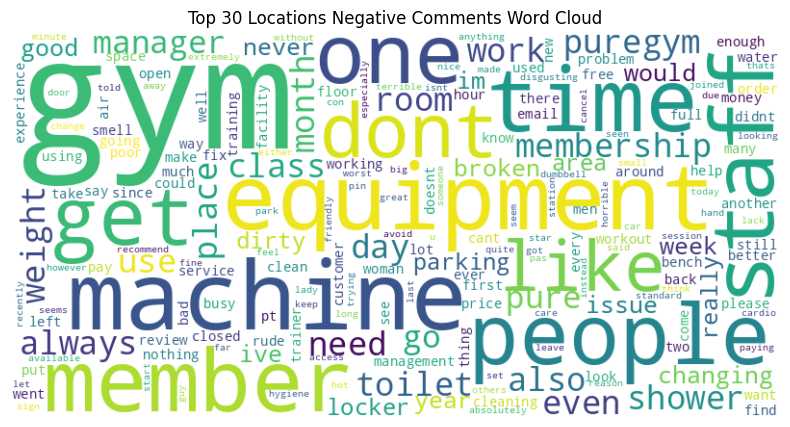

In [35]:
# Calculate frequency of each word and display top 10 words for df_trustpilot_negative
top30_freq_dist_negative = calculate_word_frequencies(df_negative_top30['lemmatized_text'])
print("10 highest frequency words in to 30 locations (Negative):")
for word, freq in freq_dist_negative.most_common(10):
    print(f"{word}: {freq}")

# Generate word clouds for negative comments
generate_wordcloud(top30_freq_dist_negative, 'Top 30 Locations Negative Comments Word Cloud')

In [36]:
# Prepare the data for BERTopic
docs = df_negative_top30['lemmatized_string'].tolist()

# Initialize and fit BERTopic model
model = BERTopic(verbose = True)
topics, probs = model.fit_transform(docs)

# Add the topics to the dataframe
df_negative_top30['Topic'] = topics

2024-08-14 07:37:31,253 - BERTopic - Embedding - Transforming documents to embeddings.


Batches:   0%|          | 0/30 [00:00<?, ?it/s]

2024-08-14 07:37:32,650 - BERTopic - Embedding - Completed ✓
2024-08-14 07:37:32,651 - BERTopic - Dimensionality - Fitting the dimensionality reduction algorithm
2024-08-14 07:37:36,521 - BERTopic - Dimensionality - Completed ✓
2024-08-14 07:37:36,522 - BERTopic - Cluster - Start clustering the reduced embeddings
2024-08-14 07:37:36,554 - BERTopic - Cluster - Completed ✓
2024-08-14 07:37:36,557 - BERTopic - Representation - Extracting topics from clusters using representation models.
2024-08-14 07:37:36,592 - BERTopic - Representation - Completed ✓


In [37]:
# List out the top 10 topics and their frequencies
topic_info = model.get_topic_info()
top_10_topics = topic_info.head(10)  # Get the top 10 topics

# Function to get top 5 words for a given topic
def get_top_words_for_topic(model, topic_id, n_words=5):
    topic = model.get_topic(topic_id)
    if topic:
        return [word for word, _ in topic[:n_words]]
    return []

# List the top 5 words for topics -1, 0, and 1
for topic_id in [-1, 0, 1]:
    top_words = get_top_words_for_topic(model, topic_id)
    print(f"Top words for topic {topic_id}: {top_words}")

print()

print("Top 10 topics and their frequencies:")
top_10_topics

Top words for topic -1: []
Top words for topic 0: ['gym', 'machine', 'equipment', 'time', 'staff']
Top words for topic 1: ['parking', 'car', 'fine', 'gym', 'free']

Top 10 topics and their frequencies:


,Topic,Count,Name,Representation,Representative_Docs
0,0,914,0_gym_machine_equipment_time,"[gym, machine, equipment, time, staff, member,...",[matter time gym always full inconvenient bein...
1,1,42,1_parking_car_fine_gym,"[parking, car, fine, gym, free, park, reg, pur...",[website boast free parking wrongly made assum...


In [38]:
model.visualize_barchart()

In [39]:
model.visualize_heatmap()

Results indicate there are too few observations for BERTopic to appropriately cluster reviews. Nonetheless, the results are unsurprising: locations with the most reviews suffer from problems associated with crowding such as lack of equipment and car parking.

### Emotion Analysis

BERT-base-uncased-emotion is a fine-tuned version of the BERT-base-uncased model from Hugging face. It has been further trained on a dataset for emotion classification, allowing it to categorize text into one of six emotions: "sadness," "joy," "love," "anger," "fear," and "surprise". The "uncased" in the model name indicates the underlying data it has been trained on contains only lowercase letters. This dataset is Twitter-Sentiment-Analysis, where tweets have been labelled as one of the six emotions above, on which the BERT-uncased-emotion has a marginally higher accuracy and F1 score than peer models. 

The steps of the model are:
1. Tokenisation, done here using Hugging Face's Autotokenizer tool, which automatically selects the appropriate tokenizer (in this case the BERT tokenizer) to best fit the model. The BERT tokenizer is different from tokenization we have done previously, as it outputs two elements: input_ids (words transformed into numerical IDs) and attention_masks (identifies word IDs versus padding). BERT tokenization includes the following steps.

    (i) standard tokenisation, 

    (ii) adding special tokens [CLS] and [SEP] at the beginning and end of each review. The classification head (the [CLS] token at the beginning of each review) is used as a summary of the entire review and will be used to make final predicitons after being passed through all layers of the model.

    (iii) mapping each tokenized word to its unique BERT ID (for example the word 'happy' would be transformed into its unique numerical ID of '3407'), 

    (iv) padding, where we will simply use padding = True which pads tokens to the longest review length. If we were training this model we may prefer to set a fixed max_length , as otherwise separate training batches would have different lengths, with potential impact on the model outcome by diluting text's signal of specific batches witha few very long reviews. This would need to be balanced with information loss from truncating large reviews (but in my experience consistency trumps accuracy, as it's usually peferrable to be consistently wrong than inconsistently right).

    (iv) generates an attention mask, flagging which elements of the input are embedded IDs (1) or padding (0).

2. The appropriately tokenized words are input into the model, where an embedding layer converts each token ID into a dense vector. These vectors are usually 768 dimensions in length to fit the size of the hiddel layers of the model. This embedding includes semantic information about the word, based on contextual relationships (e.g. surrounding words, distinguishing between 'river bank' and 'bank account') and similarity with other words ('happy' and joyful' will have embeddings that are close together, while 'happy' and 'sad' will be farther apart). As the model is pre-trained, it already has a populated vector space, therefore it already contains large amounts of information on the relationship between words.
3. the embeddings are then passed through the first of 12 transformer layers comprised of 'sub-layers'. these sub-layers are: 
    
    (i) a self-attention mechanism, which computes attention scores between all possible pairs of tokens to determine how much a token should pay attention to each other token, then creates a new vector for each token incorporating information from the attention scores. 
    
    (ii) outputs are then passed through layer normalisation, which stabilizes the training process. Residual connections are made (input of the sub-layer added to the output of the sub-layer) helping prevent the vanishing gradient problem and allowing better gradient flow during training.
    
    (iii) the adjusted vectors of each token are then passed through two dense feedforward layers, the first expanding the dimensionality from 768 to 3072 with ReLu activation, the second reducing it back to 768. 
    
    (iv) the output is normalized and residual connections are made, just as with the self-attention sub-layer.
4. the output of the first layer is input into the second layer, then the third, and so on until all 12 layers have been processed.
5. the [CLS] token embedding, which now contains a summary representation of the entire review, is extracted from the 12th layer. It is connected to a dense layer, which reduces the dimensions from 768 to 6 (one dimension for each of the six emotions) before passing these dimensions through a softmax function to transform this output vector into probabilities summing to 1.
5. The emotion class with the highest probability is selected as the model's prediction.   
    
We will first begin by testing the BERT-base-uncased-emotion model with an example, before running it on our dataset

Q: there are many other emotion classification models from hugging face, many which are far more popular. How can different models be assessed, what were the reasons for choosing BERT-uncased-emotion, and for a given text classification problem what is good practice when chosing a pre-trained model? Finally, what are best practices when fine-tuning a pre-trained model?

unrelated Q: Q&A chatbot from tabular data
unrelated Q: kernel crashes. It happened when running the emotion analysis on a google VM with 60gb memory and a Tesla P100 GPU - what are the causes? how can it be avoided?

In [40]:
# Create a text classification pipeline
emotion_classifier = pipeline("text-classification", model='bhadresh-savani/bert-base-uncased-emotion', return_all_scores=True)

Hardware accelerator e.g. GPU is available in the environment, but no `device` argument is passed to the `Pipeline` object. Model will be on CPU.


In [41]:
# Test the pipeline with an example
text = "I am so happy and excited to join puregym!"
predictions = emotion_classifier(text)

print(predictions)

[[{'label': 'sadness', 'score': 0.00025887758238241076}, {'label': 'joy', 'score': 0.9989066123962402}, {'label': 'love', 'score': 0.00035885299439541996}, {'label': 'anger', 'score': 0.00016929954290390015}, {'label': 'fear', 'score': 9.586073429090902e-05}, {'label': 'surprise', 'score': 0.0002103612059727311}]]


In [42]:
# Load the model to run on both datasets
tokenizer = AutoTokenizer.from_pretrained("bhadresh-savani/bert-base-uncased-emotion")
model = AutoModelForSequenceClassification.from_pretrained("bhadresh-savani/bert-base-uncased-emotion")

In [43]:
# Function to predict emotions from text
def predict_emotions(df, text_column):
    # Tokenize the input text from the DataFrame
    encoded_inputs = tokenizer(df[text_column].tolist(), padding=True, truncation=True, return_tensors="pt")
    
    # Run the model on the tokenized inputs
    with torch.no_grad():  # Disable gradient calculations since we're just doing inference
        outputs = model(**encoded_inputs)

    # Get the predicted probabilities
    probabilities = torch.nn.functional.softmax(outputs.logits, dim=-1)

    # Get the predicted labels
    predicted_labels = torch.argmax(probabilities, dim=1)

    # Define the emotion labels (ordered as per the model's training)
    emotion_labels = ["sadness", "joy", "love", "anger", "fear", "surprise"]

    # Add the top label and its probability to the DataFrame
    df['predicted_emotion'] = [emotion_labels[label] for label in predicted_labels]
    df['predicted_probability'] = [probabilities[i, label].item() for i, label in enumerate(predicted_labels)]
    
    return df

In [44]:
# Select the first 10 rows
df_negative_10 = df_negative.head(10)

df_negative_10

,location,date,text,score,tokenized_text,lemmatized_text,lemmatized_string,source
0,Cambridge Leisure Park,2024-05-09 22:48:39,Too many students from two local colleges go h...,1,"[many, students, two, local, colleges, go, lea...","[many, student, two, local, college, go, leave...",many student two local college go leave rubbis...,google
1,Bristol Union Gate,2024-05-09 21:48:00,"(current member)\n\nGym is quite dirty, more o...",1,"[current, member, gym, quite, dirty, often, th...","[current, member, gym, quite, dirty, often, th...",current member gym quite dirty often there soa...,google
3,New Barnet,2024-05-09 20:16:04,This gym is way too hot to even workout in. Th...,2,"[gym, way, hot, even, workout, windows, open, ...","[gym, way, hot, even, workout, window, open, a...",gym way hot even workout window open ac barely...,google
4,Manchester Cheetham Hill,2024-05-09 17:03:50,No access for wc 😢. Empty and no assistance t...,2,"[access, wc, empty, assistance, gain, access, ...","[access, wc, empty, assistance, gain, access, ...",access wc empty assistance gain access fault f...,google
5,Newcastle Eldon Garden,2024-05-09 08:38:07,After being at this gym for over a year I'm fi...,2,"[gym, year, im, finally, leaving, im, gutted, ...","[gym, year, im, finally, leaving, im, gutted, ...",gym year im finally leaving im gutted staff pt...,google
6,London Oval,2024-05-08 22:31:31,The gym is huge but where is all the equipment...,1,"[gym, huge, equipment, could, easily, fit, dou...","[gym, huge, equipment, could, easily, fit, dou...",gym huge equipment could easily fit double amo...,google
7,New Barnet,2024-05-08 20:20:02,Air-conditioning doesnt work,1,"[air, conditioning, doesnt, work]","[air, conditioning, doesnt, work]",air conditioning doesnt work,google
8,Rochdale,2024-05-08 19:59:48,"My friend is new to the gym, she had just join...",1,"[friend, new, gym, joined, struggling, get, sc...","[friend, new, gym, joined, struggling, get, sc...",friend new gym joined struggling get scanner w...,google
11,Salford,2024-05-08 15:06:34,The gym is definitely not spacious.\nHad to ca...,1,"[gym, definitely, spacious, cancel, membership...","[gym, definitely, spacious, cancel, membership...",gym definitely spacious cancel membership full...,google
12,Coventry Skydome,2024-05-08 06:51:03,"No maintenance, something is always broken, ze...",1,"[maintenance, something, always, broken, zero,...","[maintenance, something, always, broken, zero,...",maintenance something always broken zero manag...,google


In [45]:
# Predict emotions for the first 10 rows of df_google (testing)
df_negative_10 = predict_emotions(df_negative_10, 'text')

df_negative_10

,location,date,text,score,tokenized_text,lemmatized_text,lemmatized_string,source,predicted_emotion,predicted_probability
0,Cambridge Leisure Park,2024-05-09 22:48:39,Too many students from two local colleges go h...,1,"[many, students, two, local, colleges, go, lea...","[many, student, two, local, college, go, leave...",many student two local college go leave rubbis...,google,anger,0.994873
1,Bristol Union Gate,2024-05-09 21:48:00,"(current member)\n\nGym is quite dirty, more o...",1,"[current, member, gym, quite, dirty, often, th...","[current, member, gym, quite, dirty, often, th...",current member gym quite dirty often there soa...,google,sadness,0.993274
3,New Barnet,2024-05-09 20:16:04,This gym is way too hot to even workout in. Th...,2,"[gym, way, hot, even, workout, windows, open, ...","[gym, way, hot, even, workout, window, open, a...",gym way hot even workout window open ac barely...,google,anger,0.997033
4,Manchester Cheetham Hill,2024-05-09 17:03:50,No access for wc 😢. Empty and no assistance t...,2,"[access, wc, empty, assistance, gain, access, ...","[access, wc, empty, assistance, gain, access, ...",access wc empty assistance gain access fault f...,google,sadness,0.996563
5,Newcastle Eldon Garden,2024-05-09 08:38:07,After being at this gym for over a year I'm fi...,2,"[gym, year, im, finally, leaving, im, gutted, ...","[gym, year, im, finally, leaving, im, gutted, ...",gym year im finally leaving im gutted staff pt...,google,anger,0.534169
6,London Oval,2024-05-08 22:31:31,The gym is huge but where is all the equipment...,1,"[gym, huge, equipment, could, easily, fit, dou...","[gym, huge, equipment, could, easily, fit, dou...",gym huge equipment could easily fit double amo...,google,anger,0.997916
7,New Barnet,2024-05-08 20:20:02,Air-conditioning doesnt work,1,"[air, conditioning, doesnt, work]","[air, conditioning, doesnt, work]",air conditioning doesnt work,google,anger,0.444768
8,Rochdale,2024-05-08 19:59:48,"My friend is new to the gym, she had just join...",1,"[friend, new, gym, joined, struggling, get, sc...","[friend, new, gym, joined, struggling, get, sc...",friend new gym joined struggling get scanner w...,google,anger,0.998134
11,Salford,2024-05-08 15:06:34,The gym is definitely not spacious.\nHad to ca...,1,"[gym, definitely, spacious, cancel, membership...","[gym, definitely, spacious, cancel, membership...",gym definitely spacious cancel membership full...,google,anger,0.470585
12,Coventry Skydome,2024-05-08 06:51:03,"No maintenance, something is always broken, ze...",1,"[maintenance, something, always, broken, zero,...","[maintenance, something, always, broken, zero,...",maintenance something always broken zero manag...,google,anger,0.993485


In [46]:
# Create a dataframe half the size of df_negative to avoid crashing the kernel
sample_size_negative = len(df_negative) // 2

# Create dataframe to run the analysis keeping 50% of reviews, performing stratified sampling to maintain the distribution of the 'score' column for the dataframe of negative reviews
df_negative_emotion, _ = train_test_split(df_negative, test_size=1 - sample_size_negative / len(df_negative), stratify=df_negative['score'], random_state=42)

df_negative_emotion

,location,date,text,score,tokenized_text,lemmatized_text,lemmatized_string,source
1325,Manchester Market Street,2023-11-26 23:14:19,Please for the love of god can we have hot wat...,1,"[please, love, god, hot, water, showers]","[please, love, god, hot, water, shower]",please love god hot water shower,google
1221,Manchester Moston,2023-12-11 12:39:09,"Air con in the spin room doesn't work, not nic...",1,"[air, con, spin, room, doesnt, work, nice, con...","[air, con, spin, room, doesnt, work, nice, con...",air con spin room doesnt work nice condition e...,google
192,Aintree,2024-04-13 03:36:46,Not good,1,[good],[good],good,google
2616,Walton-on-Thames,2023-02-02 08:08:57,Pros.\nGood selection of equipment.\nSpacious ...,1,"[pros, good, selection, equipment, spacious, s...","[pro, good, selection, equipment, spacious, st...",pro good selection equipment spacious stretchi...,google
1421,Aberdeen Kittybrewster,2023-11-11 18:55:37,Ask for assistance on a Saturday doesn’t work....,1,"[ask, assistance, saturday, doesnt, work, well...","[ask, assistance, saturday, doesnt, work, well...",ask assistance saturday doesnt work well done,google
...,...,...,...,...,...,...,...,...
1841,Norwich Riverside,2023-09-12 00:28:27,If its hot outside don't bother going. It is u...,2,"[hot, outside, dont, bother, going, unbearable...","[hot, outside, dont, bother, going, unbearable...",hot outside dont bother going unbearable hot i...,google
1452,Newry,2023-11-07 02:04:10,Out of date,1,[date],[date],date,google
5552,Newbury,2023-09-13 14:15:00,If you sort the showers out I'll give you 5 st...,1,"[sort, showers, ill, give, stars, ice, cold, s...","[sort, shower, ill, give, star, ice, cold, sho...",sort shower ill give star ice cold shower sten...,trustpilot
660,London Swiss Cottage,2024-02-25 14:48:56,There are no 2.5kg or 1.25 kg plates.,2,"[kg, kg, plates]","[kg, kg, plate]",kg kg plate,google


In [47]:
#####


# This code cell is computationally intensive. For ease of use, the appropriate output file is provided separately and loaded in the next code cell. 


# Predict emotions for the sample of negative reviews
#df_negative_emotion = predict_emotions(df_negative_emotion, 'text')

#df_negative_emotion

# Save df_negative_emotion to a CSV file
# df_negative_emotion.to_csv('emotion_analysis_output.csv', index=False)


#####

The code above takes some time to run. the output is saved as csv below, then loaded, to save time when re-running code.

In [48]:
# Load df_negative_emotion from the CSV file
df_negative_emotion = pd.read_csv('emotion_analysis_output.csv')

df_negative_emotion

,location,date,text,score,tokenized_text,lemmatized_text,lemmatized_string,source,predicted_emotion,predicted_probability
0,Manchester Market Street,2023-11-26 23:14:19,Please for the love of god can we have hot wat...,1,"['please', 'love', 'god', 'hot', 'water', 'sho...","['please', 'love', 'god', 'hot', 'water', 'sho...",please love god hot water shower,google,love,0.989077
1,Manchester Moston,2023-12-11 12:39:09,"Air con in the spin room doesn't work, not nic...",1,"['air', 'con', 'spin', 'room', 'doesnt', 'work...","['air', 'con', 'spin', 'room', 'doesnt', 'work...",air con spin room doesnt work nice condition e...,google,joy,0.942949
2,Aintree,2024-04-13 03:36:46,Not good,1,['good'],['good'],good,google,joy,0.967293
3,Walton-on-Thames,2023-02-02 08:08:57,Pros.\nGood selection of equipment.\nSpacious ...,1,"['pros', 'good', 'selection', 'equipment', 'sp...","['pro', 'good', 'selection', 'equipment', 'spa...",pro good selection equipment spacious stretchi...,google,joy,0.995355
4,Aberdeen Kittybrewster,2023-11-11 18:55:37,Ask for assistance on a Saturday doesn’t work....,1,"['ask', 'assistance', 'saturday', 'doesnt', 'w...","['ask', 'assistance', 'saturday', 'doesnt', 'w...",ask assistance saturday doesnt work well done,google,joy,0.942362
...,...,...,...,...,...,...,...,...,...,...
1970,Norwich Riverside,2023-09-12 00:28:27,If its hot outside don't bother going. It is u...,2,"['hot', 'outside', 'dont', 'bother', 'going', ...","['hot', 'outside', 'dont', 'bother', 'going', ...",hot outside dont bother going unbearable hot i...,google,anger,0.779687
1971,Newry,2023-11-07 02:04:10,Out of date,1,['date'],['date'],date,google,anger,0.869690
1972,Newbury,2023-09-13 14:15:00,If you sort the showers out I'll give you 5 st...,1,"['sort', 'showers', 'ill', 'give', 'stars', 'i...","['sort', 'shower', 'ill', 'give', 'star', 'ice...",sort shower ill give star ice cold shower sten...,trustpilot,anger,0.527899
1973,London Swiss Cottage,2024-02-25 14:48:56,There are no 2.5kg or 1.25 kg plates.,2,"['kg', 'kg', 'plates']","['kg', 'kg', 'plate']",kg kg plate,google,anger,0.612074


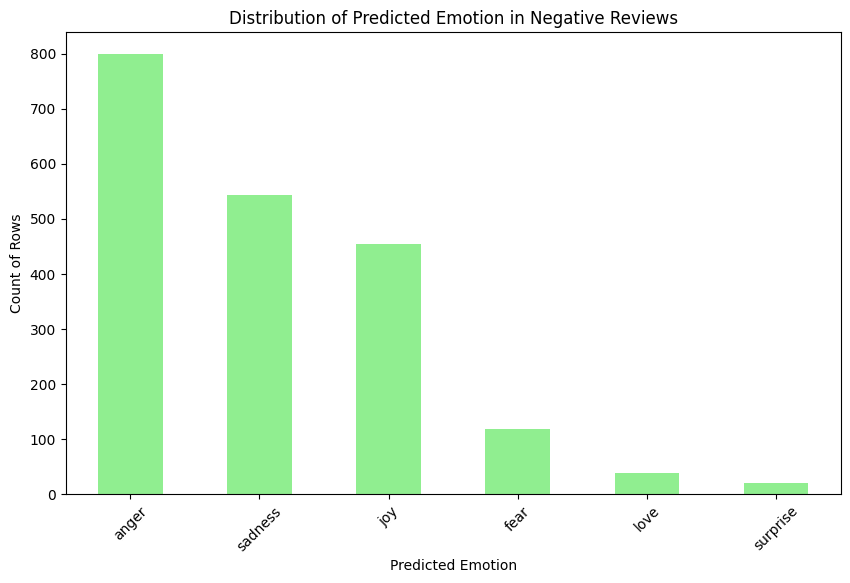

In [49]:
# Generate bar chart for df_negative_emotion
plt.figure(figsize=(10, 6))
df_negative_emotion['predicted_emotion'].value_counts().plot(kind='bar', color='lightgreen')
plt.title('Distribution of Predicted Emotion in Negative Reviews')
plt.xlabel('Predicted Emotion')
plt.ylabel('Count of Rows')
plt.xticks(rotation=45)
plt.show()

In [50]:
# Filter df_google_emotion for rows where predicted_emotion is 'anger'
df_negative_emotion_anger = df_negative_emotion[(df_negative_emotion['predicted_emotion'] == 'anger')]

df_negative_emotion_anger

,location,date,text,score,tokenized_text,lemmatized_text,lemmatized_string,source,predicted_emotion,predicted_probability
5,Ipswich Buttermarket,2023-06-27 04:36:12,I find people are on their phones too much..ju...,1,"['find', 'people', 'phones', 'muchjust', 'sitt...","['find', 'people', 'phone', 'muchjust', 'sitti...",find people phone muchjust sitting equipment a...,google,anger,0.909751
7,Grimsby,2023-07-25 16:22:00,Enquired about job opportunities with an email...,1,"['enquired', 'job', 'opportunities', 'email', ...","['enquired', 'job', 'opportunity', 'email', 'o...",enquired job opportunity email one got back pu...,trustpilot,anger,0.766036
10,London Limehouse,2023-12-12 00:13:00,The worst gym ever. 1- They’ll closed it for m...,1,"['worst', 'gym', 'ever', 'theyll', 'closed', '...","['worst', 'gym', 'ever', 'theyll', 'closed', '...",worst gym ever theyll closed maintenance infor...,trustpilot,anger,0.971159
11,Bletchley,2024-01-24 23:51:39,Very rude staff member. No need for it whatsoe...,1,"['rude', 'staff', 'member', 'need', 'whatsoeve...","['rude', 'staff', 'member', 'need', 'whatsoeve...",rude staff member need whatsoever really need ...,google,anger,0.997900
13,Northampton Central,2024-02-05 18:51:00,"They promised a discount for joining, but they...",1,"['promised', 'discount', 'joining', 'charged',...","['promised', 'discount', 'joining', 'charged',...",promised discount joining charged entire amount,trustpilot,anger,0.994361
...,...,...,...,...,...,...,...,...,...,...
1969,London North Finchley,2023-12-22 22:59:00,Only one laying leg press and one leg extensio...,2,"['one', 'laying', 'leg', 'press', 'one', 'leg'...","['one', 'laying', 'leg', 'press', 'one', 'leg'...",one laying leg press one leg extension also st...,trustpilot,anger,0.937342
1970,Norwich Riverside,2023-09-12 00:28:27,If its hot outside don't bother going. It is u...,2,"['hot', 'outside', 'dont', 'bother', 'going', ...","['hot', 'outside', 'dont', 'bother', 'going', ...",hot outside dont bother going unbearable hot i...,google,anger,0.779687
1971,Newry,2023-11-07 02:04:10,Out of date,1,['date'],['date'],date,google,anger,0.869690
1972,Newbury,2023-09-13 14:15:00,If you sort the showers out I'll give you 5 st...,1,"['sort', 'showers', 'ill', 'give', 'stars', 'i...","['sort', 'shower', 'ill', 'give', 'star', 'ice...",sort shower ill give star ice cold shower sten...,trustpilot,anger,0.527899


In [51]:
# Prepare the data for BERTopic
docs = df_negative_emotion_anger['lemmatized_text'].tolist()

# Initialize and fit BERTopic model
model = BERTopic(verbose = True)
topics, probs = model.fit_transform(docs)

# Add the topics to the dataframe
df_negative_emotion_anger['Topic'] = topics

2024-08-14 07:37:39,890 - BERTopic - Embedding - Transforming documents to embeddings.


Batches:   0%|          | 0/25 [00:00<?, ?it/s]

2024-08-14 07:37:41,660 - BERTopic - Embedding - Completed ✓
2024-08-14 07:37:41,661 - BERTopic - Dimensionality - Fitting the dimensionality reduction algorithm
2024-08-14 07:37:44,692 - BERTopic - Dimensionality - Completed ✓
2024-08-14 07:37:44,693 - BERTopic - Cluster - Start clustering the reduced embeddings
2024-08-14 07:37:44,720 - BERTopic - Cluster - Completed ✓
2024-08-14 07:37:44,723 - BERTopic - Representation - Extracting topics from clusters using representation models.
2024-08-14 07:37:44,772 - BERTopic - Representation - Completed ✓


In [52]:
model.visualize_barchart()

In [53]:
model.visualize_heatmap()

### LLM Approach

falcon-7b-instruct is an LLM model developed by the Technology Innovation Institute (TII) in the UAE. This model is part of the Falcon family of models, which have been designed for various NLP tasks. The "7b" in the name refers to the model's size, containing approximately 7 billion parameters, making it resource intensive. The "instruct" suffix indicates that this model has been fine-tuned specifically for instruction-following tasks, making it particularly suitable for applications where the model is required to generate human-like responses based on instructions or prompts. Much like BERT, it follows a transformer-based architecture.

In [18]:
# Load the tokenizer and model
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
tokenizer = AutoTokenizer.from_pretrained("tiiuae/falcon-7b-instruct")
model = AutoModelForCausalLM.from_pretrained("tiiuae/falcon-7b-instruct", torch_dtype=torch.bfloat16, device_map="auto",offload_folder="offload")

Loading checkpoint shards:   0%|          | 0/2 [00:00<?, ?it/s]

In [19]:
# Print the device of the model
for param in model.parameters():
    print(param.device)
    break

cuda:0


To generate relatively similar topics, the model will be ran using a low top_k and top_p. This will reduce the model's 'creativity', hopefully generating highly coherent text to feed into BERTopic. 

In [20]:
# Function to generate topics with max_length=1000 and truncation=True
def generate_topics(text):
    # Prompt
    prompt = f"In the following customer review, pick out the main 3 topics. Return them in a numbered list format, with each one on a new line.\n\n{text}"

    # Tokenize the prompt with truncation and max_length
    inputs = tokenizer(prompt, return_tensors="pt", truncation=True, max_length=1000).to(device)
    
    # Generate the response with max_length for the output
    with torch.no_grad():
        outputs = model.generate(**inputs, max_length=1000, do_sample=True, top_k = 10, top_p=0.8, num_return_sequences=1)
    
    # Decode the generated text
    generated_text = tokenizer.decode(outputs[0], skip_special_tokens=True)
    
    # Split the generated text into lines
    lines = generated_text.split('\n')
    
    # Step 1: Keep only lines that start with a number (the enumerated topics)
    numbered_lines = [line.strip() for line in lines if line.strip() and line.strip()[0].isdigit()]
    
    # Step 2: Remove numbers and periods
    cleaned_topics = [line.lstrip('1234567890. ').strip() for line in numbered_lines]
    
    return cleaned_topics

In [23]:
# Create a dataframe half the size of df_negative to avoid crashing the kernel
sample_size_negative = len(df_negative) // 2

# Create a dataframe to run the llm keeping 25% of reviews, performing stratified sampling to maintain the distribution of the 'score' column 
df_negative_llm, _ = train_test_split(df_negative, test_size=1 - sample_size_negative / len(df_negative), stratify=df_negative['score'], random_state=42)

In [ ]:
#####


# This code cell is computationally intensive. For ease of use, the appropriate output file is provided separately and loaded in the next code cell. 


# List to store the topics
#topics_llm = []


# Convert the DataFrame column to a list for efficiency
#reviews_list = df_negative_llm['text'].tolist()

# Process each review and save the results after every row
#for i, review in enumerate(reviews_list):
    #print(f"Processing review {i + 1}/{len(reviews_list)}: {review[:50]}...")  # Print the current review being processed

    #if len(str(review)) < 1000:  # appropriate review length
        #topics = generate_topics(review)
        #topics_llm.append(topics)  # Append the list of topics

    # Save the topics after processing each review
    #np.save('np_topics_llm.npy', np.array(topics_llm, dtype=object))

    #print(f"Completed processing review {i + 1}/{len(reviews_list)}")

# Save the array to a CSV file
#np.savetxt('falcon_llm_topics.csv', llm_topics, delimiter=',', fmt='%s')

#print("Final topics saved to np_topics_llm.npy")

# Load the list of topics generated
#llm_topics = np.load('np_topics_llm.npy', allow_pickle=True)

# Remove empty lists
#non_empty_topics = [topics for topics in topics_llm if topics]

# Flatten the list of lists into a single list
#llm_topics = [topic for sublist in non_empty_topics for topic in sublist]

# Convert the NumPy array to a pandas DataFrame
#df_llm_topics = pd.DataFrame(llm_topics, columns=['topics'])

# Save the DataFrame to a CSV file with a header
#df_llm_topics.to_csv('falcon_llm_topics.csv', index=False)


#####

In [20]:
df_llm_topics = pd.read_csv('falcon_llm_topics.csv')

df_llm_topics

,topics
0,Poor customer service
1,Gym pass not working
2,Long wait for customer support
3,Unpleasant odor
4,Poor quality
...,...
8170,Unprofessional conduct
8171,Poor service quality
8172,Shower facilities smell bad.
8173,Inadequate breakfast options.


In [21]:
# Prepare the data for BERTopic
docs = df_llm_topics['topics'].astype(str).tolist()

# Initialize and fit BERTopic model
model = BERTopic(verbose = True)
topics, probs = model.fit_transform(docs)

# Add the topics to the dataframe
df_llm_topics['Topic'] = topics

# Visualize the topics
model.visualize_topics()

2024-08-14 10:12:37,460 - BERTopic - Embedding - Transforming documents to embeddings.


Batches:   0%|          | 0/256 [00:00<?, ?it/s]

2024-08-14 10:12:40,905 - BERTopic - Embedding - Completed ✓
2024-08-14 10:12:40,906 - BERTopic - Dimensionality - Fitting the dimensionality reduction algorithm
2024-08-14 10:13:11,912 - BERTopic - Dimensionality - Completed ✓
2024-08-14 10:13:11,913 - BERTopic - Cluster - Start clustering the reduced embeddings
2024-08-14 10:13:12,171 - BERTopic - Cluster - Completed ✓
2024-08-14 10:13:12,176 - BERTopic - Representation - Extracting topics from clusters using representation models.
2024-08-14 10:13:12,381 - BERTopic - Representation - Completed ✓


In [22]:
model.visualize_barchart()

In [23]:
model.visualize_heatmap()

The first two themes identified by BERTopic are concerned with poor customer service.

With the topics identified, we will now feed them back into the falcon-7b model, now querying it on what actions should Puregym could take to mitigate the concerns identified above. For this model we will set a relatively higher top_k and top_p, which should allow the model to generate more creative answers by allowing it to consider words with lower probability densities.   

In [27]:
# Load the tokenizer and model
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
tokenizer = AutoTokenizer.from_pretrained("tiiuae/falcon-7b-instruct")
model = AutoModelForCausalLM.from_pretrained("tiiuae/falcon-7b-instruct", torch_dtype=torch.bfloat16, device_map="auto",offload_folder="offload")

Loading checkpoint shards:   0%|          | 0/2 [00:00<?, ?it/s]

Some parameters are on the meta device device because they were offloaded to the cpu.


In [26]:
# Function to analyse topics
def analyse_topics(topics, max_new_tokens = 100):
    # Prompt
    prompt = f"For the following text topics obtained from negative customer reviews, can you give some actionable insights that would help this gym company?\n\n{topics}"

    # Tokenize the prompt
    inputs = tokenizer(prompt, return_tensors="pt").to(device)
    
    # Generate the response with top_k, top_p, and max_length for the output
    with torch.no_grad():
        outputs = model.generate(**inputs, max_new_tokens = max_new_tokens, top_k=25, top_p=0.95, num_return_sequences=1)
    
    # Decode the generated text
    generated_text = tokenizer.decode(outputs[0], skip_special_tokens=True)
    
    # Return the generated text directly
    return generated_text.strip()

The generated topics will be split into 20 chunks to be fed into the model, not because we particularly want 20 individual suggestions but due to the token limit of 2048 of the model.

In [ ]:
# Split the list into 20 equal groups of 250 items each
chunk_size = 250
num_chunks = 20
chunks = [df_llm_topics.iloc[i * chunk_size:(i + 1) * chunk_size] for i in range(num_chunks)]

In [ ]:
#####


# This code cell is computationally intensive. For ease of use, the appropriate output file is provided separately and loaded in the next code cell. 



# Process each chunk individually
#results = []
#for i, chunk in enumerate(chunks):
    #print(f"Processing chunk {i + 1}/{num_chunks}...")
    #chunk_result = analyse_topics(chunk['topics'].tolist(), max_new_tokens=200)
    #results.append(chunk_result)

# Combine the results or handle them as needed
#llm_suggestions = "\n\n".join(results)

# Save results in a numpy array
#np.save('np_suggestions_llm.npy', llm_suggestions)


#####

Setting `pad_token_id` to `eos_token_id`:11 for open-end generation.


Processing chunk 1/20...


Setting `pad_token_id` to `eos_token_id`:11 for open-end generation.


Processing chunk 2/20...


Setting `pad_token_id` to `eos_token_id`:11 for open-end generation.


Processing chunk 3/20...


Setting `pad_token_id` to `eos_token_id`:11 for open-end generation.


Processing chunk 4/20...


Setting `pad_token_id` to `eos_token_id`:11 for open-end generation.


Processing chunk 5/20...


Setting `pad_token_id` to `eos_token_id`:11 for open-end generation.


Processing chunk 6/20...


Setting `pad_token_id` to `eos_token_id`:11 for open-end generation.


Processing chunk 7/20...


Setting `pad_token_id` to `eos_token_id`:11 for open-end generation.


Processing chunk 8/20...


Setting `pad_token_id` to `eos_token_id`:11 for open-end generation.


Processing chunk 9/20...


Setting `pad_token_id` to `eos_token_id`:11 for open-end generation.


Processing chunk 10/20...


Setting `pad_token_id` to `eos_token_id`:11 for open-end generation.


Processing chunk 11/20...


Setting `pad_token_id` to `eos_token_id`:11 for open-end generation.


Processing chunk 12/20...


Setting `pad_token_id` to `eos_token_id`:11 for open-end generation.


Processing chunk 13/20...


Setting `pad_token_id` to `eos_token_id`:11 for open-end generation.


Processing chunk 14/20...


Setting `pad_token_id` to `eos_token_id`:11 for open-end generation.


Processing chunk 15/20...


Setting `pad_token_id` to `eos_token_id`:11 for open-end generation.


Processing chunk 16/20...


Setting `pad_token_id` to `eos_token_id`:11 for open-end generation.


Processing chunk 17/20...


Setting `pad_token_id` to `eos_token_id`:11 for open-end generation.


Processing chunk 18/20...


Setting `pad_token_id` to `eos_token_id`:11 for open-end generation.


Processing chunk 19/20...


Setting `pad_token_id` to `eos_token_id`:11 for open-end generation.


Processing chunk 20/20...


In [ ]:
# Load the .npy file, transform it into a dataframe, and save it as a .csv file
llm_suggestions = np.load('np_suggestions_llm.npy', allow_pickle=True)


In [35]:
# Convert the numpy array to a string
suggestions_str = str(llm_suggestions)

# Define the pattern to match text between "]\n" and "\n\n"
pattern = r"]\n(.*?)\n\nFor"

# Use regular expressions to find all matches
suggestions_list = re.findall(pattern, suggestions_str, re.DOTALL)

# Clean the suggestions by removing unwanted characters
cleaned_suggestions_list = [
    suggestion.replace("[", "").replace("]", "").replace('"', "").replace("'", "").replace("\n", "").strip()
    for suggestion in suggestions_list
]

# Create a DataFrame from the cleaned list of suggestions and save it
df_llm_suggestions = pd.DataFrame(cleaned_suggestions_list, columns=['suggestions'])
df_llm_suggestions.to_csv('falcon_llm_suggestions.csv', index=False)

df_llm_suggestions

,suggestions
0,Based on the text topics obtained from the cus...
1,The customer feedback provided in the text con...
2,The customer feedback provided in the text con...
3,Based on the text topics obtained from the cus...
4,"Based on the text, the main actionable insight..."
5,"Based on the text, some actionable insights fo..."
6,The text topics obtained from the customer rev...
7,The text topics obtained from the customer rev...
8,"Based on the customer reviews, some actionable..."
9,The text topics obtained from customer reviews...


looking at the csv file containing the results, we now have 19 suggestions instead of 20 (close enough, one likely got lost during the cleaning stages after the model). These 19 suggestions emphasize staff responsiveness, gym cleanliness and equipment availability. 

My personal favourite insight is #12, which repeats 'poor customer service' 32 times. Surely sharing this suggestion to Puregym staff will improve service (and employee morale). On a more serious note this insight illustrates the limitations of an LLM: as it is primarily concered with predicting which word comes next, it cannot 'stop and think' about what concrete steps could be taken by Puregym to resolve its issues. Perhaps using a stronger model (e.g. GPT-3) or a more focussed prompt would aid the model in generating useful insights.

### LDA Analysis

Latent Dirichlet Allocation (LDA) is a generative probabilistic model used for topic modelling in a collection of documents. It is far less computationally intensive than an LLM, and as an unsupervised method it can be applied to any dataset without prior labelling. It relies on the bag-of-words method, which assumes the order of words does not matter, leading to some loss of context.

In [37]:
# Create a dataframe half the size of df_negative
sample_size_negative = len(df_negative) // 2

# Create a dataframe to run LDA keeping 50% of reviews, performing stratified sampling to maintain the distribution of the 'score' column 
df_negative_lda, _ = train_test_split(df_negative, test_size=1 - sample_size_negative / len(df_negative), stratify=df_negative['score'], random_state=42)

In [42]:
# Identifying which reviews to analyse
tokenized_docs = df_negative_lda['lemmatized_string'].apply(lambda x: x.split()).tolist()

In [43]:
# Create a dictionary from the tokenized documents
dictionary = Dictionary(tokenized_docs)

# Filter out extremes to remove very common and very rare words
dictionary.filter_extremes(no_below=30, no_above=0.5)  # hopwfully this removes the word 'gym' from the analysis

# Convert the tokenized documents into the bag-of-words format
corpus = [dictionary.doc2bow(doc) for doc in tokenized_docs]

In [44]:
# Set the number of topics
num_topics = 10

# Train the LDA model
lda_model = LdaModel(corpus=corpus,
                     id2word=dictionary,
                     num_topics=num_topics,
                     passes=15,
                     random_state=42)

# Print the top 10 words for each topic
for idx, topic in lda_model.print_topics(-1):
    print(f"Topic {idx}: {topic}")

Topic 0: 0.042*"puregym" + 0.029*"member" + 0.025*"cleaning" + 0.024*"year" + 0.021*"equipment" + 0.020*"good" + 0.017*"staff" + 0.016*"station" + 0.013*"new" + 0.013*"ive"
Topic 1: 0.024*"music" + 0.021*"pure" + 0.014*"member" + 0.014*"please" + 0.014*"change" + 0.014*"dont" + 0.014*"loud" + 0.013*"would" + 0.013*"need" + 0.012*"”"
Topic 2: 0.030*"staff" + 0.023*"member" + 0.017*"like" + 0.016*"equipment" + 0.015*"ive" + 0.014*"manager" + 0.013*"pt" + 0.013*"people" + 0.012*"one" + 0.012*"weight"
Topic 3: 0.042*"class" + 0.021*"time" + 0.020*"trainer" + 0.019*"one" + 0.017*"even" + 0.017*"personal" + 0.015*"shower" + 0.015*"way" + 0.015*"dont" + 0.015*"membership"
Topic 4: 0.030*"membership" + 0.028*"day" + 0.026*"class" + 0.023*"get" + 0.022*"service" + 0.020*"customer" + 0.017*"help" + 0.015*"access" + 0.014*"time" + 0.014*"month"
Topic 5: 0.046*"room" + 0.041*"changing" + 0.033*"shower" + 0.032*"toilet" + 0.025*"dirty" + 0.024*"machine" + 0.018*"smell" + 0.017*"place" + 0.016*"brok

In [46]:
# Get the topic distribution for the first document
document_topics = lda_model.get_document_topics(corpus[0])

lda_display = gensimvis.prepare(lda_model, corpus, dictionary)
pyLDAvis.display(lda_display)